## **Scanpy Host-Microbiome data**

### **CHIP D03453G3**

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import random
random.seed(123)
np.random.seed(123)

import os
import sys
sys.path.insert(0, "/scratch_isilon/groups/singlecell/data/STEREOSEQ_RAW/Stereoseq_analysis/scripts/segmentation_based")

from custom_functions import spatialDensityFeaturePlot, spatialFeaturePlot, spatialClonePlot

In [2]:
%load_ext autoreload
%autoreload 2

### **Loading data**

In [3]:
hdata = sc.read_h5ad("/home/groups/singlecell/cfernandez/test_D03453G3_75binS.h5ad")
hdata

AnnData object with n_obs × n_vars = 12058 × 27146
    obs: 'orig.ident', 'x', 'y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'underTissue', 'keep'
    var: 'mito', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'binSize', 'bin_size', 'bin_type', 'description', 'orig_var_names', 'resolution', 'sn', 'spatial'
    obsm: 'spatial'

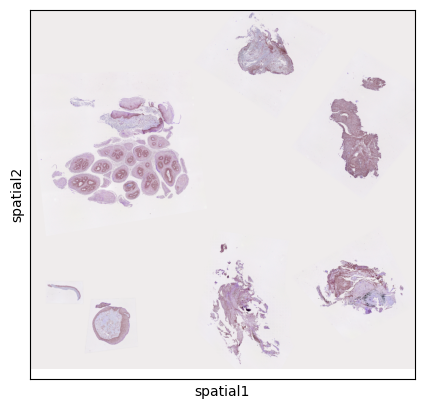

In [4]:
sc.pl.spatial(hdata, img_key='HeElowRes', spot_size=1, alpha=1)

In [5]:
coords_df = pd.DataFrame(hdata.obsm['spatial'], index=hdata.obs_names, columns=['y', 'x'])
coords_df.describe()

,y,x
count,12058.000000,12058.000000
mean,12219.352297,12269.870625
std,4980.576150,4654.192303
min,3150.000000,3000.000000
25%,7575.000000,8700.000000
50%,12525.000000,11100.000000
75%,17025.000000,16800.000000
max,21150.000000,20250.000000


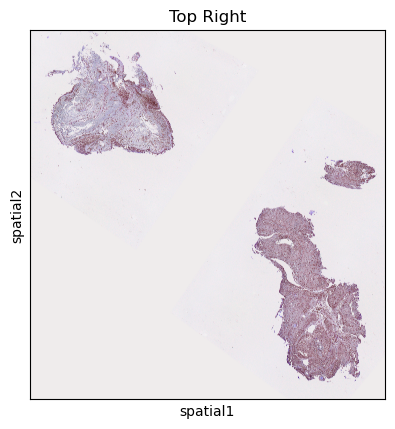

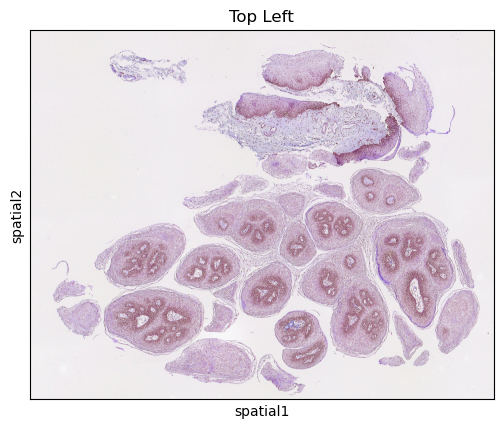

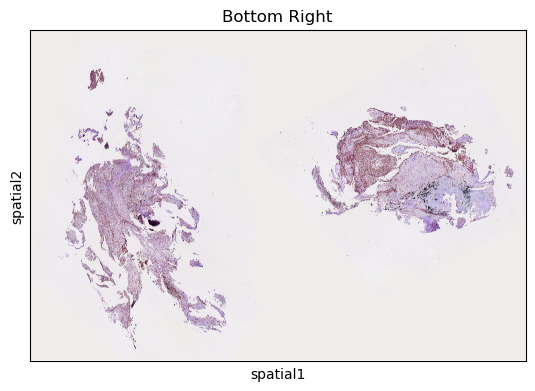

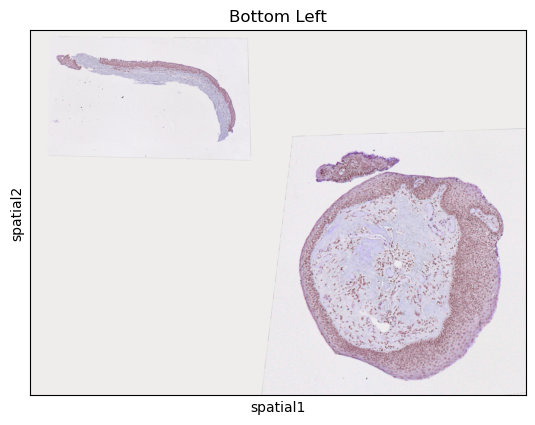

In [6]:
# Define cuts
x_mid = 12500
y_mid = 11000

# Masks
mask_upper_right = (coords_df['x'] < x_mid) & (coords_df['y'] > y_mid)
mask_upper_left = (coords_df['x'] < x_mid) & (coords_df['y'] < y_mid)
mask_bottom_right = (coords_df['x'] > x_mid) & (coords_df['y'] > y_mid)
mask_bottom_left = (coords_df['x'] > x_mid) & (coords_df['y'] < y_mid)

# Subset AnnData
adata_upper_right = hdata[mask_upper_right.values].copy()
adata_upper_left = hdata[mask_upper_left.values].copy()
adata_bottom_right = hdata[mask_bottom_right.values].copy()
adata_bottom_left = hdata[mask_bottom_left.values].copy()

sc.pl.spatial(
    adata_upper_right,
    img_key="HeE", 
    color=None,
    alpha_img=1.0,
    title='Top Right')

sc.pl.spatial(
    adata_upper_left,
    img_key="HeE",  
    color=None,
    alpha_img=1.0,
    title='Top Left')

sc.pl.spatial(
    adata_bottom_right,
    img_key="HeE",
    color=None,
    alpha_img=1.0,
    title='Bottom Right')

sc.pl.spatial(
    adata_bottom_left,
    img_key="HeE",  
    color=None,
    alpha_img=1.0,
    title='Bottom Left')


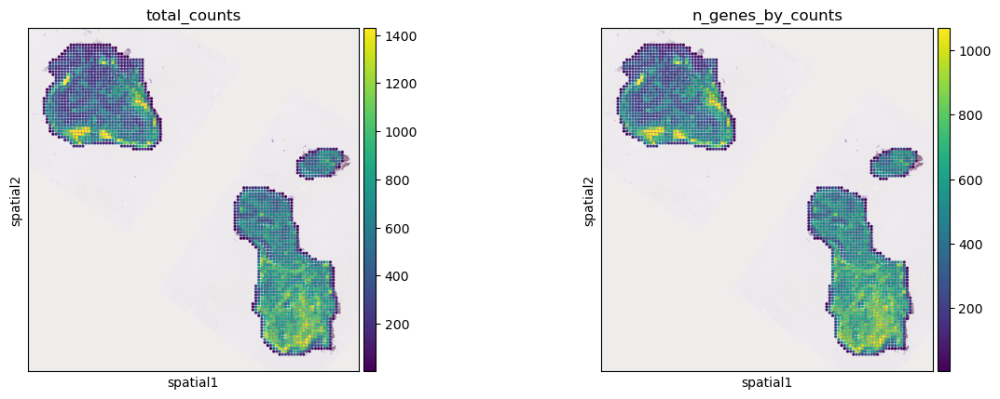

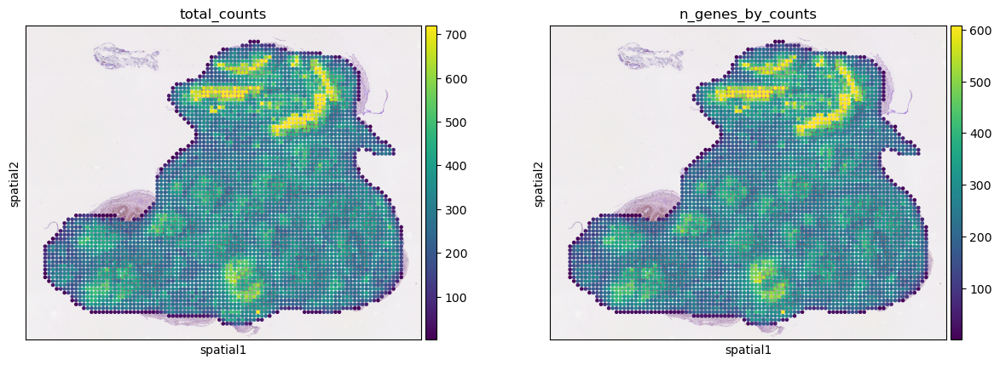

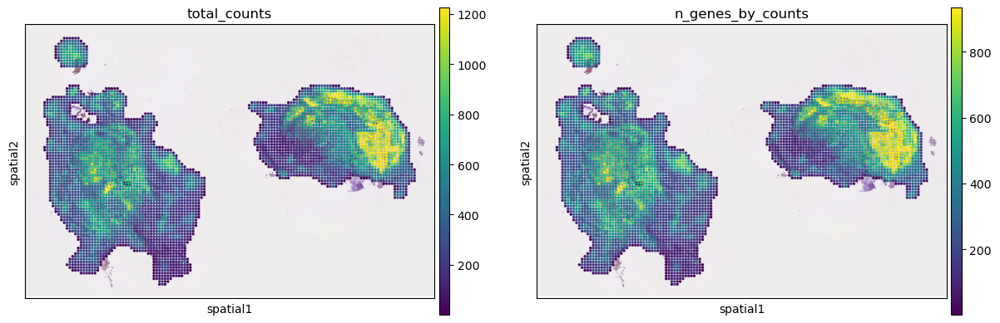

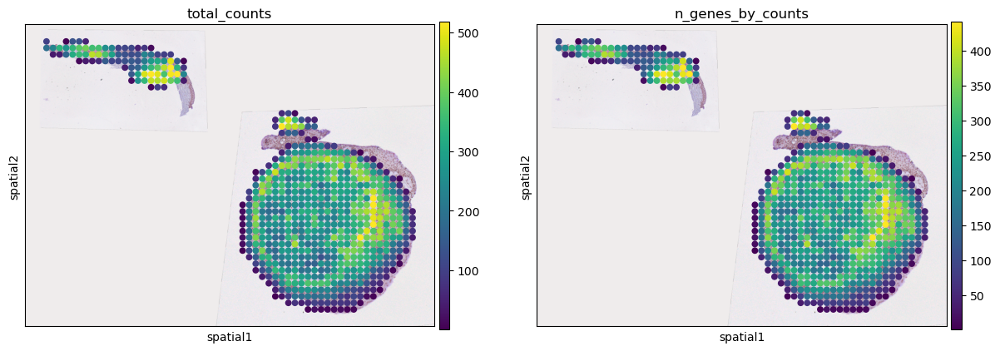

In [7]:
sc.pp.calculate_qc_metrics(adata_upper_left, inplace=True)
sc.pp.calculate_qc_metrics(adata_upper_right, inplace=True)
sc.pp.calculate_qc_metrics(adata_bottom_left, inplace=True)
sc.pp.calculate_qc_metrics(adata_bottom_right, inplace=True)

sc.pl.spatial(
    adata_upper_right,
    color=["total_counts", "n_genes_by_counts"],
    vmax='p99',
    img_key='HeElowRes')

sc.pl.spatial(
    adata_upper_left,
    color=["total_counts", "n_genes_by_counts"],
    vmax='p99',
    img_key='HeElowRes')

sc.pl.spatial(
    adata_bottom_right,
    color=["total_counts", "n_genes_by_counts"],
    vmax='p99',
    img_key='HeElowRes')

sc.pl.spatial(
    adata_bottom_left,
    color=["total_counts", "n_genes_by_counts"],
    vmax='p99',
    img_key='HeElowRes')

In [8]:
adatas = [
    ('Upper Left', adata_upper_left),
    ('Upper Right', adata_upper_right),
    ('Bottom Left', adata_bottom_left),
    ('Bottom Right', adata_bottom_right)]

regions = []
spots = []
genes = []
median_total_counts = []
median_n_genes_by_counts = []

# Metrices
for name, ad in adatas:
    regions.append(name)
    spots.append(ad.n_obs)
    genes.append(ad.n_vars)
    median_total_counts.append(ad.obs['total_counts'].median())
    median_n_genes_by_counts.append(ad.obs['n_genes_by_counts'].median())

# Summary DataFrame 
summary_df = pd.DataFrame({
    'Region': regions,
    'Total spots': spots,
    'Total genes': genes,
    'Median counts': median_total_counts,
    'Median genes': median_n_genes_by_counts})

summary_df

,Region,Total spots,Total genes,Median counts,Median genes
0,Upper Left,4405,27146,321.0,264.0
1,Upper Right,2504,27146,601.0,494.0
2,Bottom Left,657,27146,264.0,233.0
3,Bottom Right,4492,27146,392.0,340.5


In [9]:
total_counts = adata_upper_left.obs['total_counts']

high_counts = total_counts[total_counts > 1000]
print(high_counts)

32212254731850    1499
Name: total_counts, dtype: uint64


### **Visualization**


 QC Plots for region: Upper Left


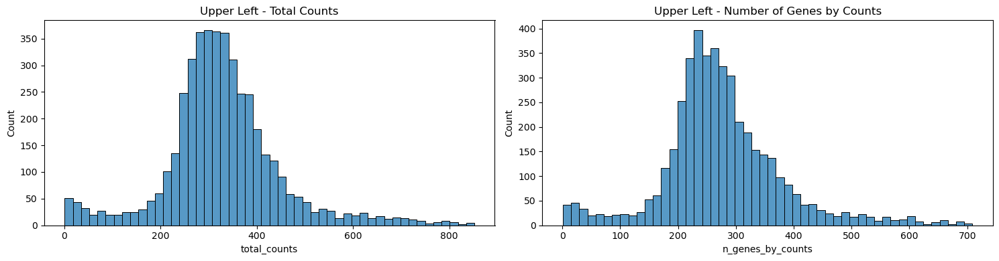

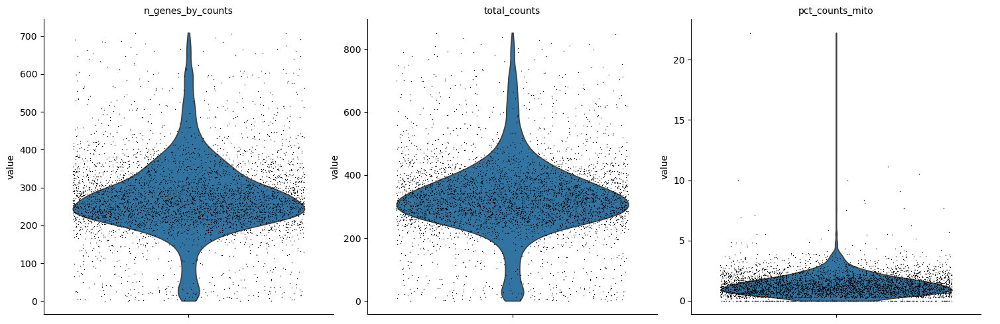

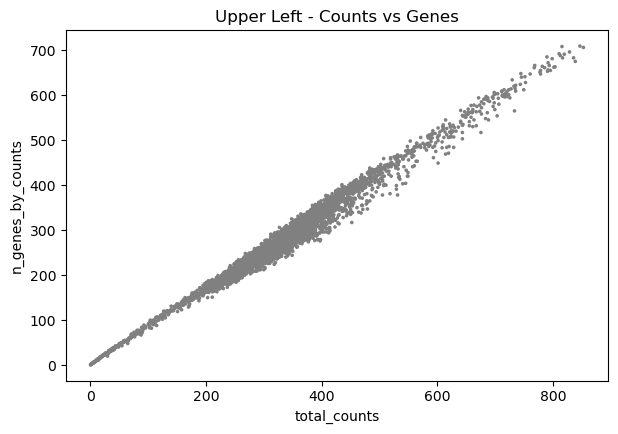


 QC Plots for region: Upper Right


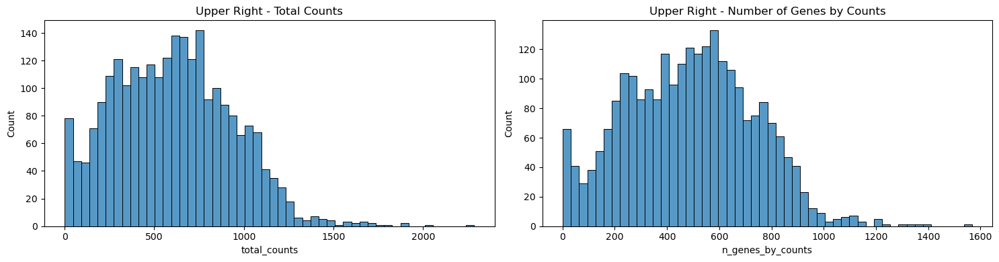

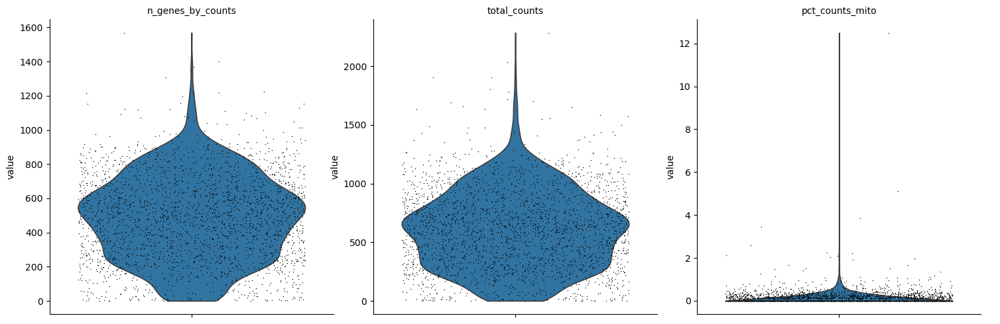

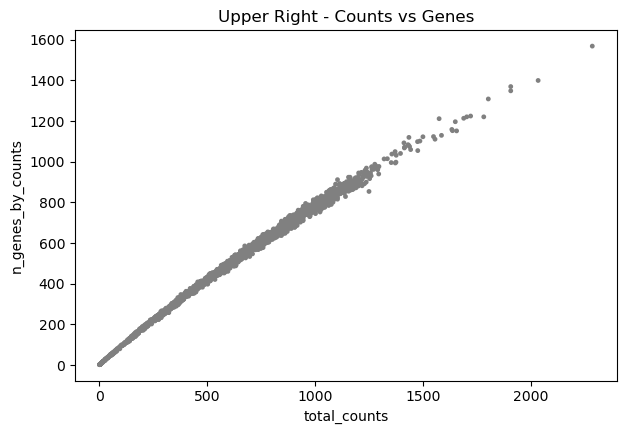


 QC Plots for region: Bottom Left


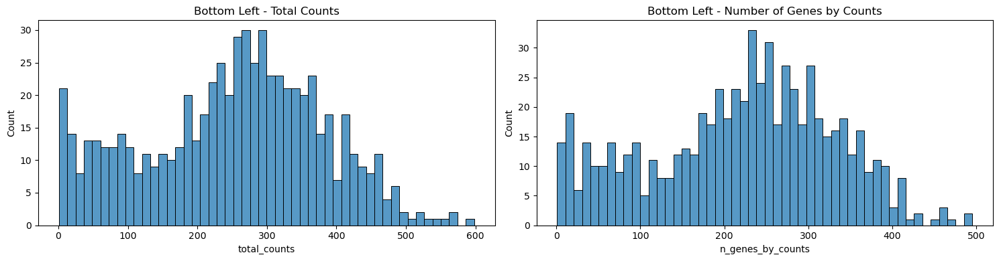

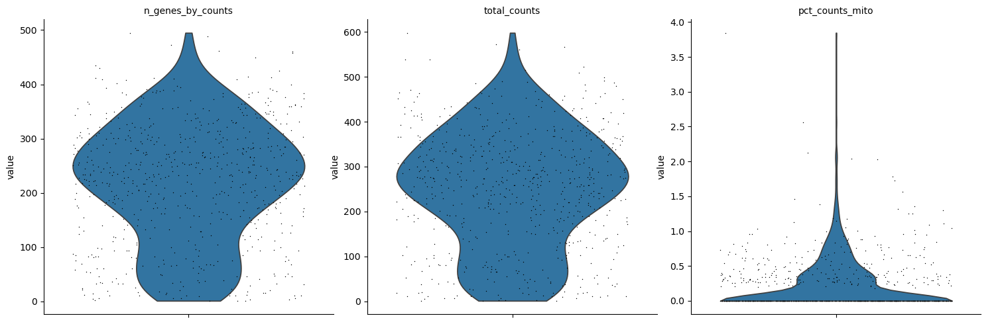

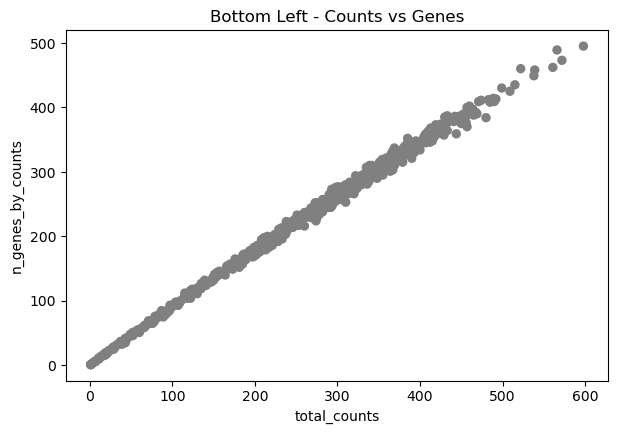


 QC Plots for region: Bottom Right


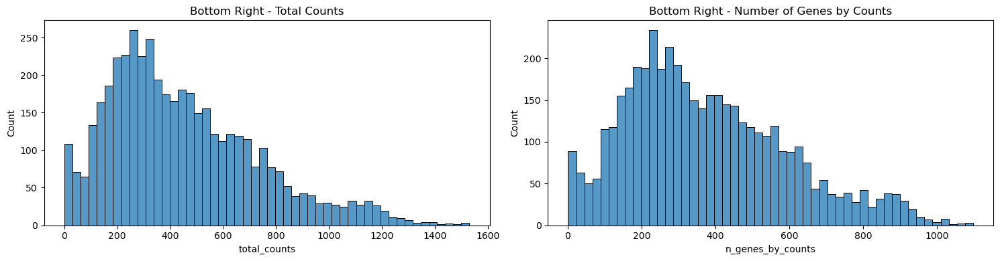

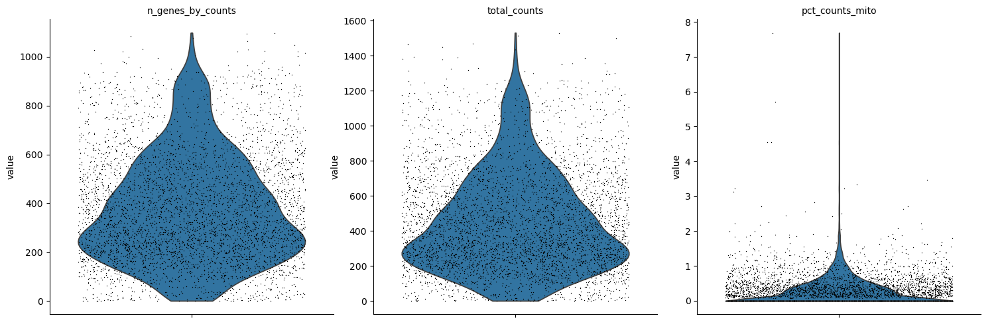

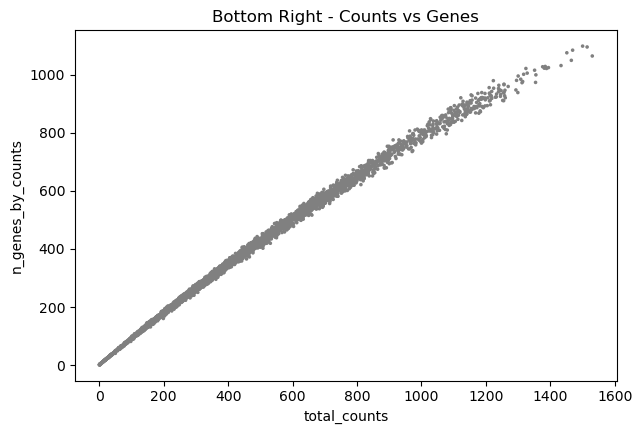

In [10]:
sc.pp.filter_cells(adata_upper_left, max_counts=1000) # removing one high spot

for name, ad in adatas:
    print(f"\n QC Plots for region: {name}")

    # Histograms
    fig, axs = plt.subplots(1, 2, figsize=(15, 4))
    sns.histplot(ad.obs["total_counts"], kde=False, ax=axs[0], bins=50)
    axs[0].set_title(f"{name} - Total Counts")

    sns.histplot(ad.obs["n_genes_by_counts"], kde=False, ax=axs[1], bins=50)
    axs[1].set_title(f"{name} - Number of Genes by Counts")

    plt.tight_layout()
    plt.show()

    # Violin plots
    sc.pl.violin(
        ad,
        ["n_genes_by_counts", "total_counts", "pct_counts_mito"],
        jitter=0.4,
        multi_panel=True,
        show=True)

    # Scatter plot
    sc.pl.scatter(
        ad,
        x="total_counts",
        y="n_genes_by_counts",
        title=f"{name} - Counts vs Genes",
        show=True)

In [12]:
#adata_upper_left.write("violin_adata_upper_left_host.h5ad")
#adata_upper_right.write("violin_adata_upper_right_host.h5ad")
#adata_bottom_left.write("violin_adata_bottom_left_host.h5ad")
#adata_bottom_right.write("violin_adata_bottom_right_host.h5ad")

### **Filterings**

In [11]:
# Objects with minimum counts of 30, minimum 10 cells with a gene and <5% mitocondrial
adatas = {
    "upper_left": adata_upper_left,
    "upper_right": adata_upper_right,
    "bottom_left": adata_bottom_left,
    "bottom_right": adata_bottom_right}

for key, ad in adatas.items():
    
    # Filter unwanted genes
    gene_names = ad.var_names.astype(str)

    has_dot = gene_names.str.contains(r'\.', regex=True)
    is_NEAT1 = gene_names == 'NEAT1'
    is_MALAT1 = gene_names == 'MALAT1'
    is_mito = gene_names.str.startswith(('MT-', 'mt-'))
    is_ribo = gene_names.str.startswith(('RPS', 'RPL'))

    to_remove = has_dot | is_NEAT1 | is_MALAT1 | is_mito | is_ribo
    genes_to_keep = ~to_remove

    # Apply filter
    ad = ad[:, genes_to_keep].copy()

    # Save the filtered objects in the dict
    adatas[key] = ad

for key, ad in adatas.items():
    # Filters
    sc.pp.filter_cells(ad, min_counts=200)
    sc.pp.filter_genes(ad, min_cells=5)
    
    # Save the filtered objects in the dict
    adatas[key] = ad

# Reasign
adata_upper_left = adatas["upper_left"]
adata_upper_right = adatas["upper_right"]
adata_bottom_left = adatas["bottom_left"]
adata_bottom_right = adatas["bottom_right"]

print(f"cells after filters: {adata_upper_left.n_obs}")
print(f"cells after filters: {adata_upper_right.n_obs}")
print(f"cells after filters: {adata_bottom_left.n_obs}")
print(f"cells after filters: {adata_bottom_right.n_obs}")

cells after filters: 3875
cells after filters: 2205
cells after filters: 423
cells after filters: 3541


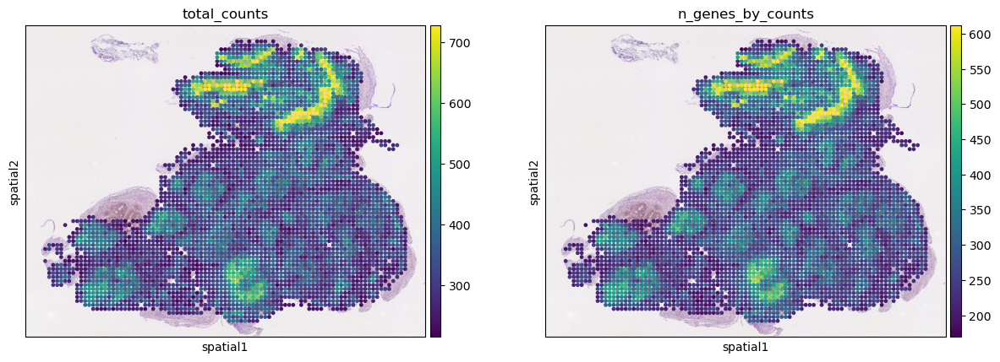

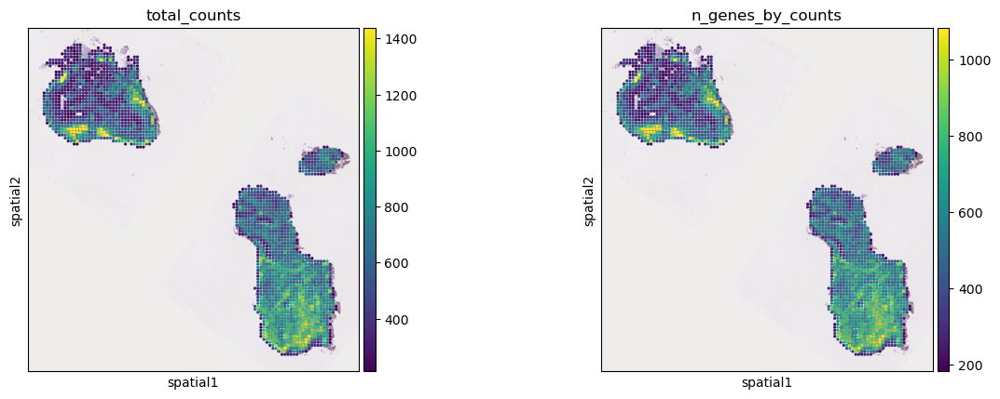

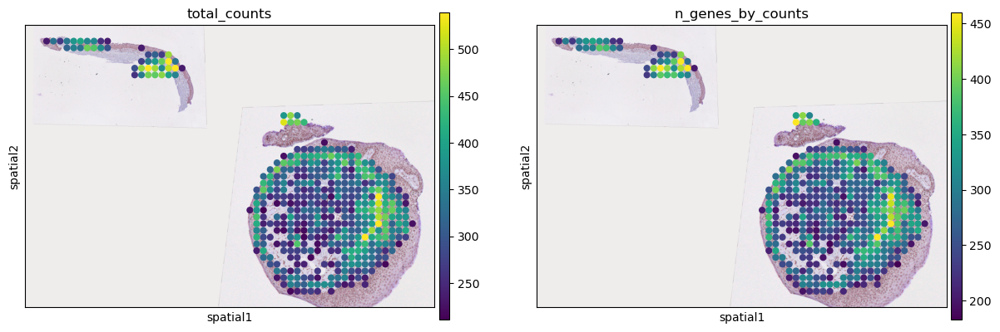

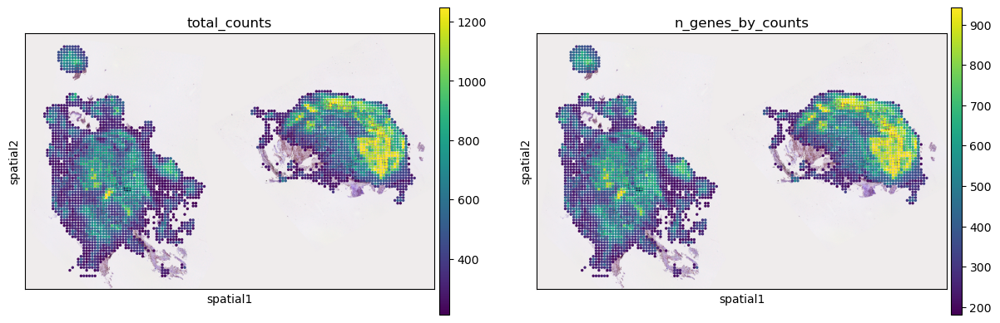

In [12]:
sc.pl.spatial(
    adata_upper_left,
    color=["total_counts", "n_genes_by_counts"],
    vmax='p99',
    img_key='HeElowRes',
    #save = "_spatial_upper_left.png")

sc.pl.spatial(
    adata_upper_right,
    color=["total_counts", "n_genes_by_counts"],
    vmax='p99',
    img_key='HeElowRes',
    #save= "_spatial_upper_right.png")

sc.pl.spatial(
    adata_bottom_left,
    color=["total_counts", "n_genes_by_counts"],
    vmax='p99',
    img_key='HeElowRes',
    #save= "_spatial_bottom_left.png")

sc.pl.spatial(
    adata_bottom_right,
    color=["total_counts", "n_genes_by_counts"],
    vmax='p99',
    img_key='HeElowRes',
    #save= "_spatial_bottom_right.png")

### **Normalization**

In [13]:
# Normalizing to median total counts and Logarithmize the data
for adata in [adata_upper_left, adata_upper_right, adata_bottom_left, adata_bottom_right]:
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    adata.raw = adata

### **Feature Selection**

2323


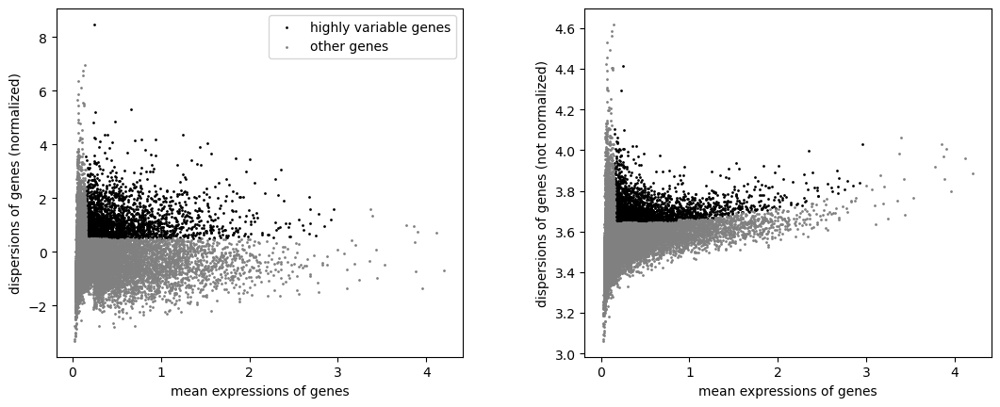

2318


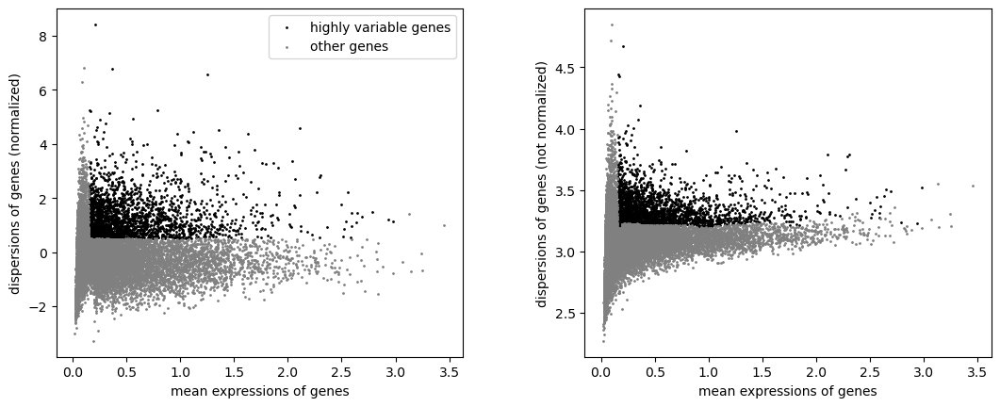

1505


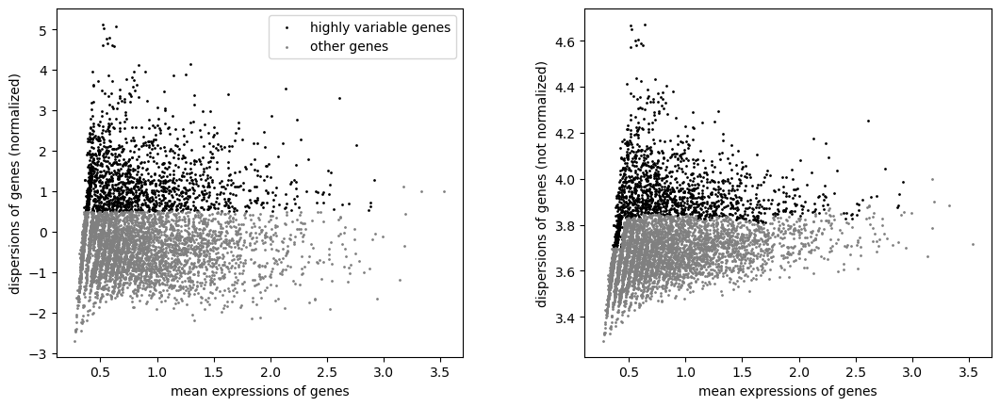

2503


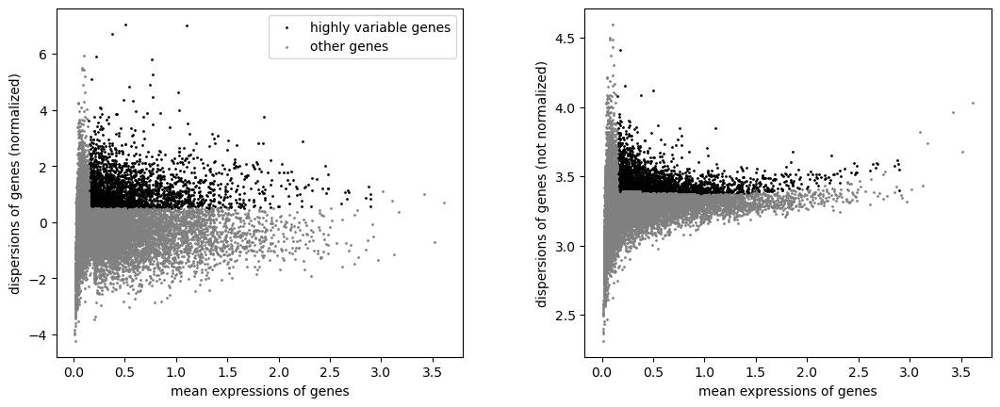

In [14]:
regions = {
    "upper_left": adata_upper_left,
    "upper_right": adata_upper_right,
    "bottom_left": adata_bottom_left,
    "bottom_right": adata_bottom_right}

for name, adata in regions.items():
    # Select highly variable genes
    sc.pp.highly_variable_genes(
        adata,
        min_mean=0.15,
        max_mean=3,
        min_disp=0.5,
        flavor = 'seurat',
        subset=False)
    
    print(adata.var['highly_variable'].sum())

    # Visualization
    sc.pl.highly_variable_genes(adata, #save= f"_hvg_{name}.png")

### **Embedding**


### PCA for upper_left ###


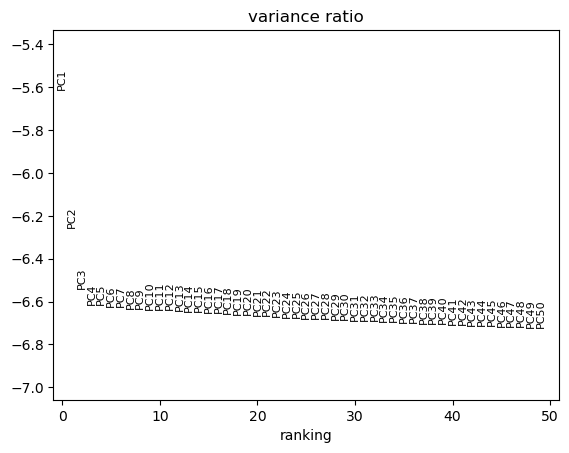


### PCA for upper_right ###


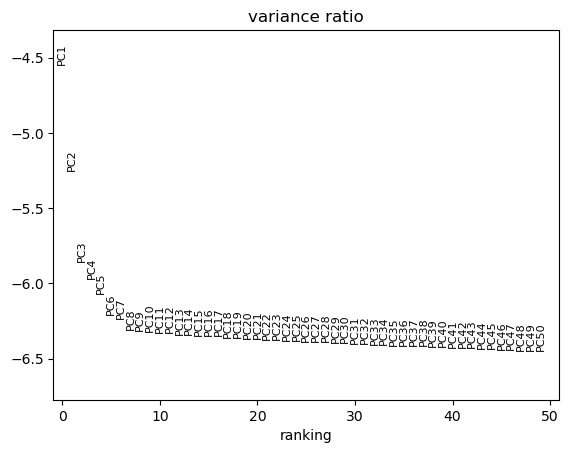


### PCA for bottom_left ###


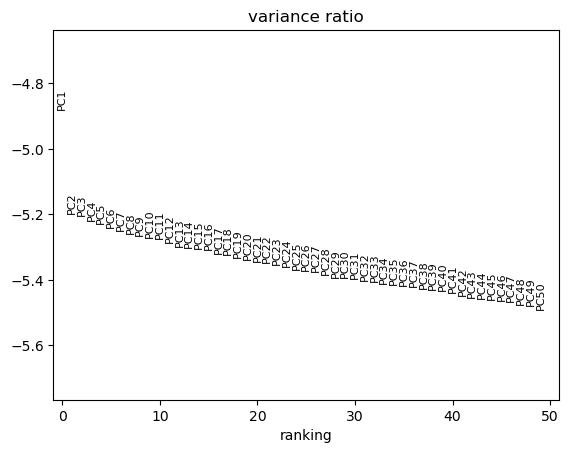


### PCA for bottom_right ###


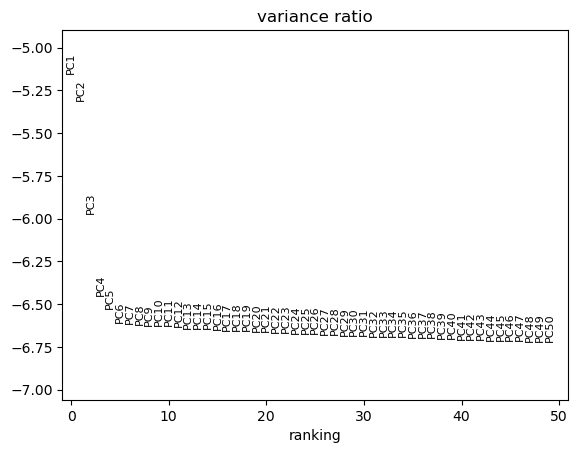

In [15]:
# PCA
for name, adata in regions.items():
    sc.pp.scale(adata)
    print(f"\n### PCA for {name} ###")
    # PCA with 50 components
    sc.tl.pca(adata, n_comps=50)
    sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True, #save= f"_{name}.png")

### **Nearest neighbor graph constuction and visualization**

In [16]:
for name, adata in regions.items():
    # Neighbors
    sc.pp.neighbors(adata, n_pcs=25)
    
    # UMAP
    sc.tl.umap(adata) 

### **Downstream Ananlyses for each sample**

### **Upper Left Object**

### **Clustering**

In [17]:
palette = sns.color_palette("tab20", n_colors=20)

In [18]:
sc.tl.leiden(adata_upper_left, resolution=0.7, key_added='leiden_0.7', random_state=123)

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


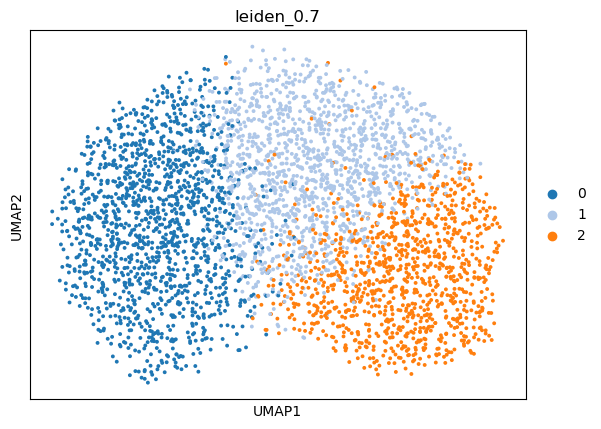

In [19]:
# UMAP plot (for resolution 0.7)
sc.pl.umap(adata_upper_left, color='leiden_0.7', palette=palette, #save= "_upper_left.png")

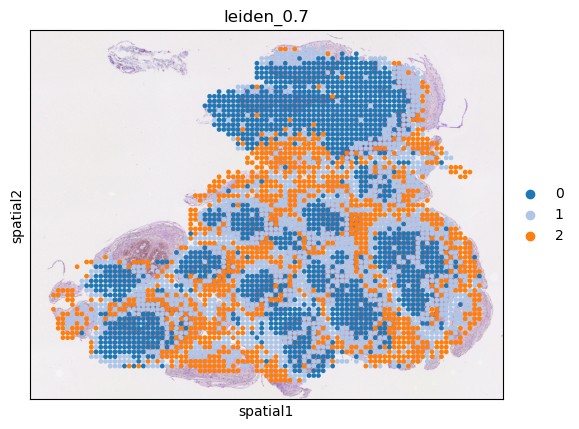

[<Axes: title={'center': 'leiden_0.7'}, xlabel='spatial1', ylabel='spatial2'>]

In [26]:
sc.pl.spatial(
            adata_upper_left,
            color='leiden_0.7',
            img_key='HeElowRes',
            alpha=1.0,
            palette=palette,
            return_fig=True,
            #save= "_clusters_upper_left.png")

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: UserWarning: The palette list has more values (20) than needed (3), which may not be intended.
  ax = sns.violinplot(
/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


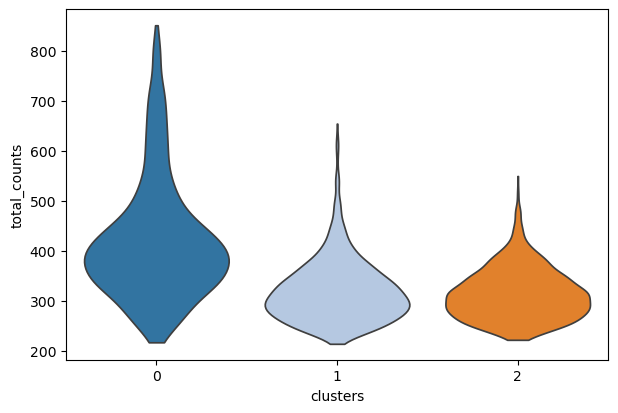

In [30]:
# Violin plot 
sc.pl.violin(
            adata_upper_left,
            keys=['total_counts'],
            groupby='leiden_0.7',
            jitter=0.4,
            stripplot=False,
            palette=palette,
            xlabel= 'clusters',
            #save= "_clusters_upper_left.png")

### **Marker Genes**

In [34]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(
            adata_upper_left,
            groupby='leiden_0.7',
            use_raw=True, 
            layer=None, 
            method='wilcoxon', 
            key_added='rank_genes_leiden_0.7')

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


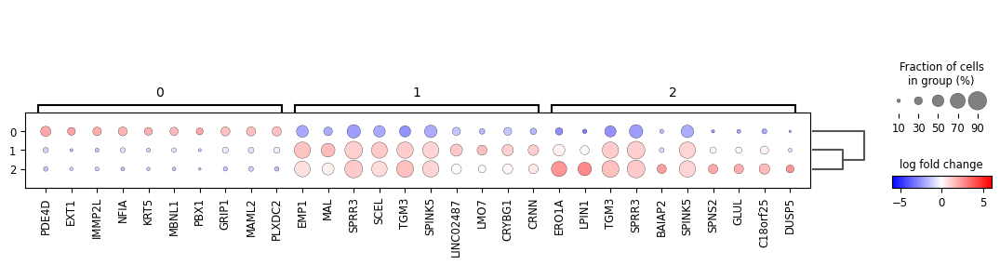

In [35]:
# Dotplot
sc.pl.rank_genes_groups_dotplot(
            adata_upper_left,
            key='rank_genes_leiden_0.7',  
            values_to_plot="logfoldchanges",
            groupby='leiden_0.7',
            n_genes=10,
            vmax = 6,
            vmin=-6,
            min_logfoldchange = 1,
            cmap='bwr',
            colorbar_title='log fold change')

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


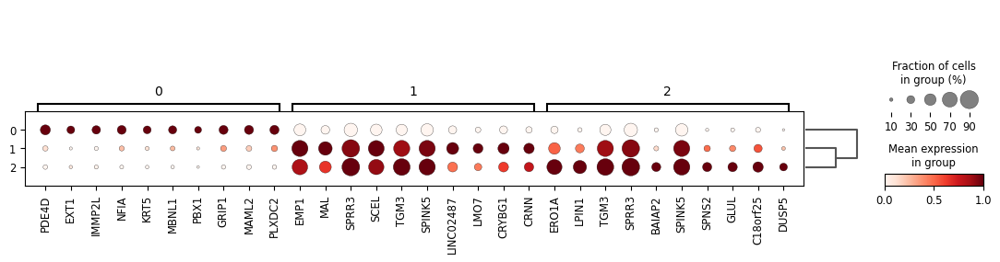

In [36]:
# Dotplot
sc.pl.rank_genes_groups_dotplot(
            adata_upper_left,
            key='rank_genes_leiden_0.7',  
            groupby='leiden_0.7',
            n_genes=10,
            min_logfoldchange = 1,
            standard_scale='var',
            #save= "_upper_left.png")

### **Upper Right Object**

### **Clustering**

In [20]:
sc.tl.leiden(adata_upper_right, resolution=0.8, key_added='leiden_0.8', random_state=123)

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


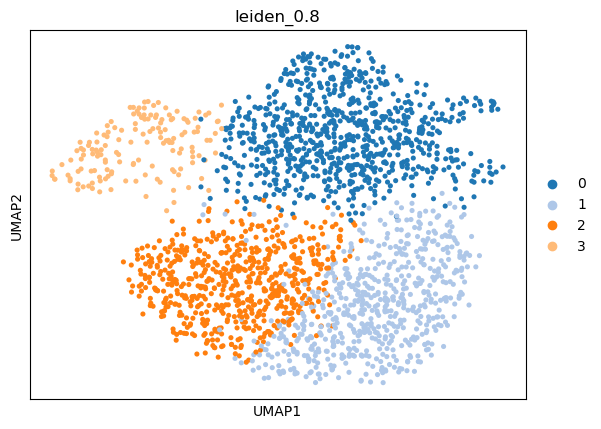

In [21]:
# UMAP plot (for resolution 0.8)
sc.pl.umap(adata_upper_right, color='leiden_0.8', palette=palette, #save= "_upper_right.png")

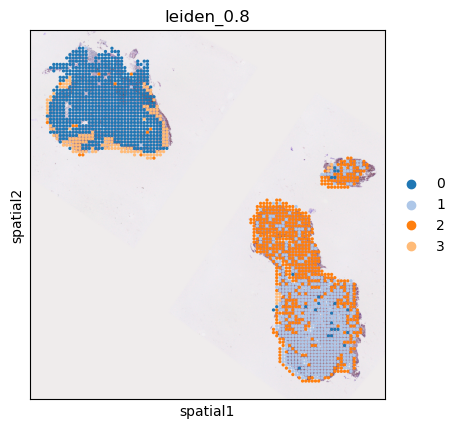

[<Axes: title={'center': 'leiden_0.8'}, xlabel='spatial1', ylabel='spatial2'>]

In [27]:
sc.pl.spatial(
            adata_upper_right,
            color='leiden_0.8',
            img_key='HeElowRes',
            alpha=1.0,
            palette=palette,
            return_fig=True,
            #save= "_clusters_upper_right.png")

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: UserWarning: The palette list has more values (20) than needed (4), which may not be intended.
  ax = sns.violinplot(
/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


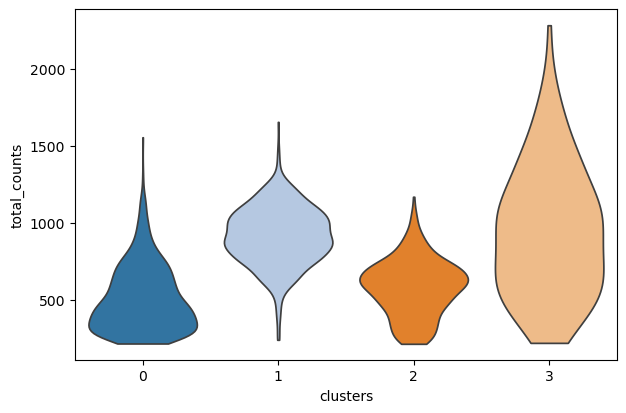

In [31]:
# Violin plot 
sc.pl.violin(
            adata_upper_right,
            keys=['total_counts'],
            groupby='leiden_0.8',
            jitter=0.4,
            stripplot=False,
            palette=palette,
            xlabel= 'clusters',
            #save= "_clusters_upper_right.png")

### **Marker Genes**

In [37]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(
            adata_upper_right,
            groupby='leiden_0.8',
            use_raw=True, 
            layer=None, 
            method='wilcoxon', 
            key_added='rank_genes_leiden_0.8')

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


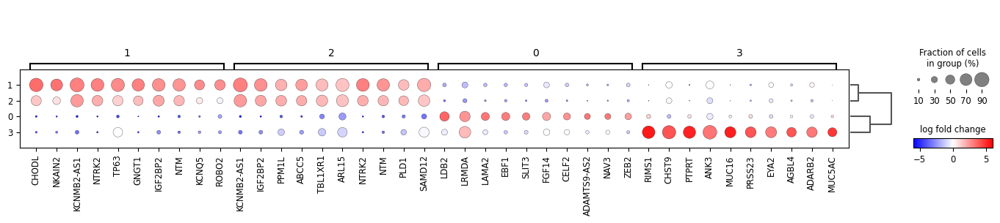

In [38]:
# Dotplot
sc.pl.rank_genes_groups_dotplot(
            adata_upper_right,
            key='rank_genes_leiden_0.8',  
            values_to_plot="logfoldchanges",
            groupby='leiden_0.8',
            n_genes=10,
            vmax = 6,
            vmin=-6,
            min_logfoldchange = 1,
            cmap='bwr',
            colorbar_title='log fold change')

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


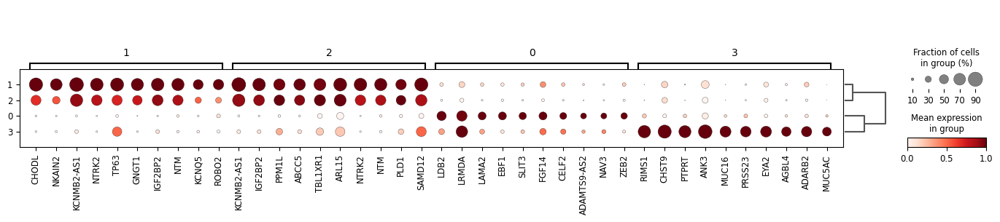

In [39]:
# Dotplot
sc.pl.rank_genes_groups_dotplot(
            adata_upper_right,
            key='rank_genes_leiden_0.8',  
            groupby='leiden_0.8',
            n_genes=10,
            min_logfoldchange = 1,
            standard_scale='var',
            #save= "_upper_right.png")

### **Bottom Left Object**

### **Clustering**

In [22]:
sc.tl.leiden(adata_bottom_left, resolution=0.6, key_added='leiden_0.6', random_state=123)

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


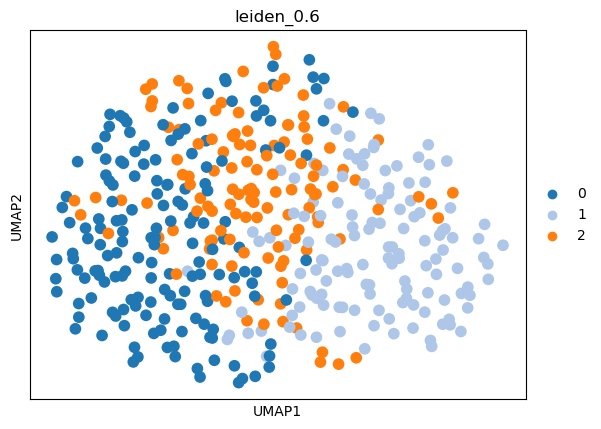

In [23]:
# UMAP plot (for resolution 0.6)
sc.pl.umap(adata_bottom_left, color='leiden_0.6', palette=palette, #save= "_bottom_left.png")

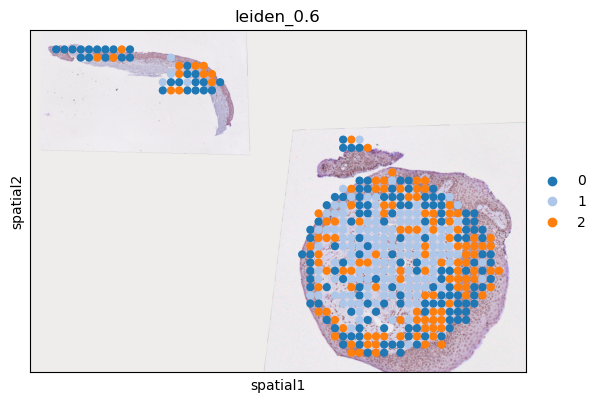

[<Axes: title={'center': 'leiden_0.6'}, xlabel='spatial1', ylabel='spatial2'>]

In [28]:
sc.pl.spatial(
            adata_bottom_left,
            color='leiden_0.6',
            img_key='HeElowRes',
            alpha=1.0,
            palette=palette,
            return_fig=True,
            #save= "_clusters_bottom_left.png")

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: UserWarning: The palette list has more values (20) than needed (3), which may not be intended.
  ax = sns.violinplot(
/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


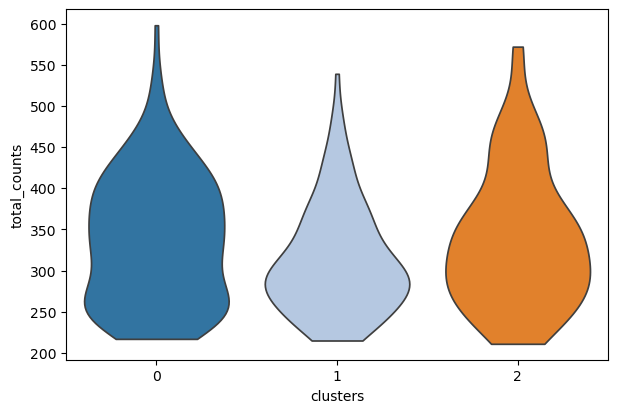

In [32]:
# Violin plot 
sc.pl.violin(
            adata_bottom_left,
            keys=['total_counts'],
            groupby='leiden_0.6',
            jitter=0.4,
            stripplot=False,
            palette=palette,
            xlabel= 'clusters',
            #save= "_clusters_bottom_left.png")

### **Marker Genes**

In [40]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(
            adata_bottom_left,
            groupby='leiden_0.6',
            use_raw=True, 
            layer=None, 
            method='wilcoxon', 
            key_added='rank_genes_leiden_0.6')

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


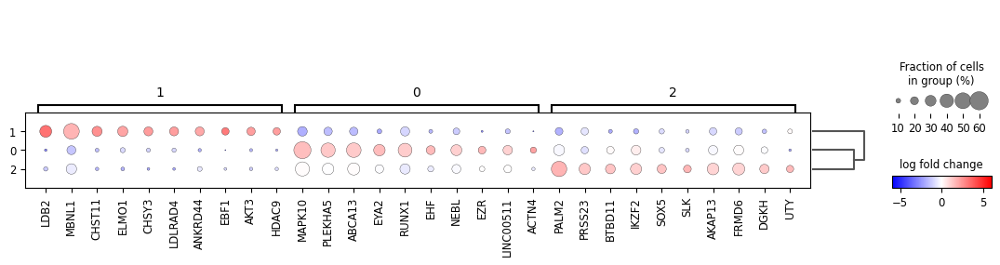

In [41]:
# Dotplot
sc.pl.rank_genes_groups_dotplot(
            adata_bottom_left,
            key='rank_genes_leiden_0.6',  
            values_to_plot="logfoldchanges",
            groupby='leiden_0.6',
            n_genes=10,
            vmax = 6,
            vmin=-6,
            min_logfoldchange = 1,
            cmap='bwr',
            colorbar_title='log fold change')

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


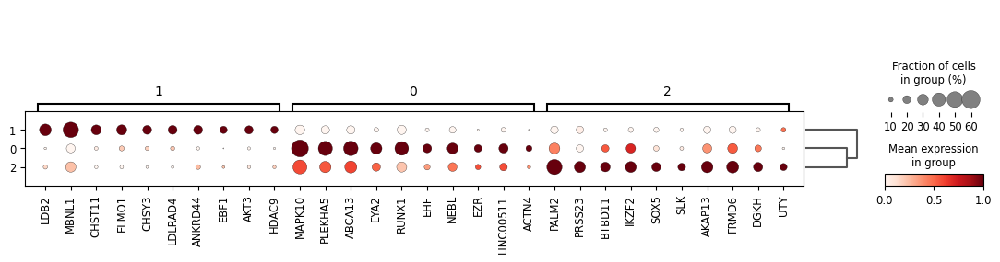

In [42]:
# Dotplot
sc.pl.rank_genes_groups_dotplot(
            adata_bottom_left,
            key='rank_genes_leiden_0.6',  
            groupby='leiden_0.6',
            n_genes=10,
            min_logfoldchange = 1,
            standard_scale='var',
            #save= "_bottom_left.png")

### **Bottom Right Object**

### **Clustering**

In [24]:
sc.tl.leiden(adata_bottom_right, resolution=0.5, key_added='leiden_0.5', random_state=123)

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


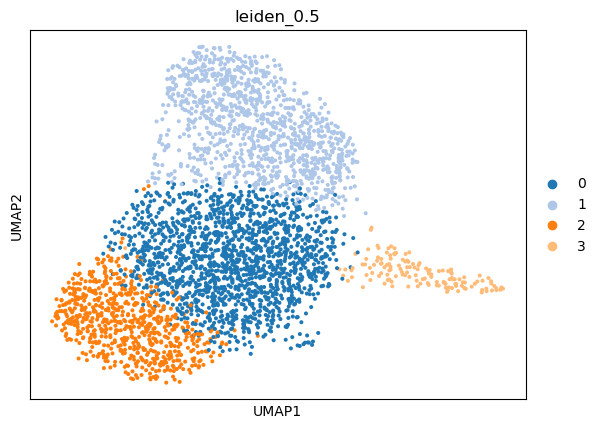

In [25]:
# UMAP plot (for resolution 0.5)
sc.pl.umap(adata_bottom_right, color='leiden_0.5', palette=palette, #save= "_bottom_right.png")

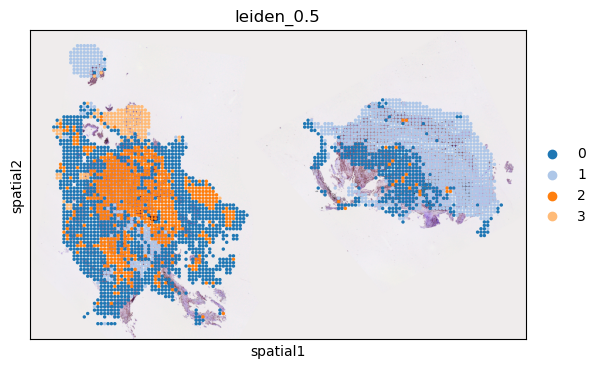

[<Axes: title={'center': 'leiden_0.5'}, xlabel='spatial1', ylabel='spatial2'>]

In [29]:
sc.pl.spatial(
            adata_bottom_right,
            color='leiden_0.5',
            img_key='HeElowRes',
            alpha=1.0,
            palette=palette,
            return_fig=True,
            #save= "_clusters_bottom_right.png")

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: UserWarning: The palette list has more values (20) than needed (4), which may not be intended.
  ax = sns.violinplot(
/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


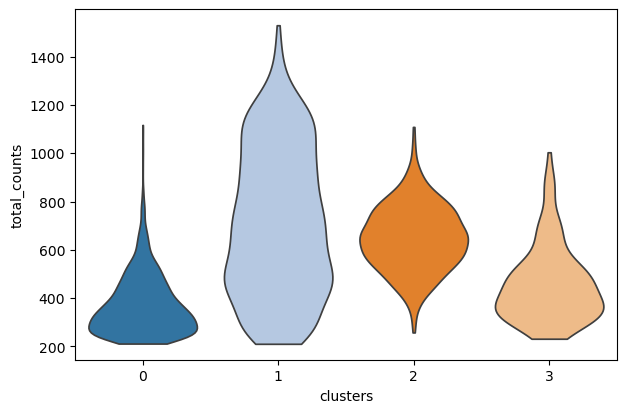

In [33]:
# Violin plot 
sc.pl.violin(
            adata_bottom_right,
            keys=['total_counts'],
            groupby='leiden_0.5',
            jitter=0.4,
            stripplot=False,
            palette=palette,
            xlabel= 'clusters',
            #save= "_clusters_bottom_right.png")

### **Marker Genes**

In [43]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(
            adata_bottom_right,
            groupby='leiden_0.5',
            use_raw=True, 
            layer=None, 
            method='wilcoxon', 
            key_added='rank_genes_leiden_0.5')

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


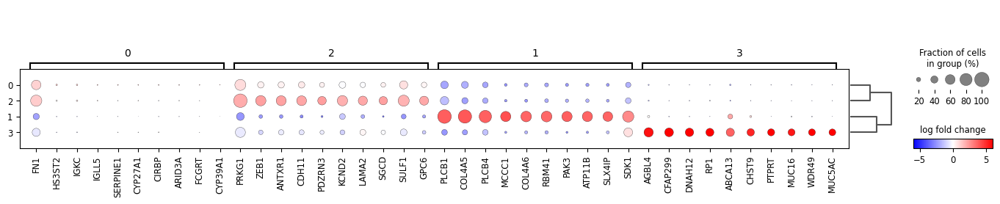

In [44]:
# Dotplot
sc.pl.rank_genes_groups_dotplot(
            adata_bottom_right,
            key='rank_genes_leiden_0.5',  
            values_to_plot="logfoldchanges",
            groupby='leiden_0.5',
            n_genes=10,
            vmax = 6,
            vmin=-6,
            min_logfoldchange = 1,
            cmap='bwr',
            colorbar_title='log fold change')

/home/groups/singlecell/cfernandez/miniconda3/envs/stereopy_env/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


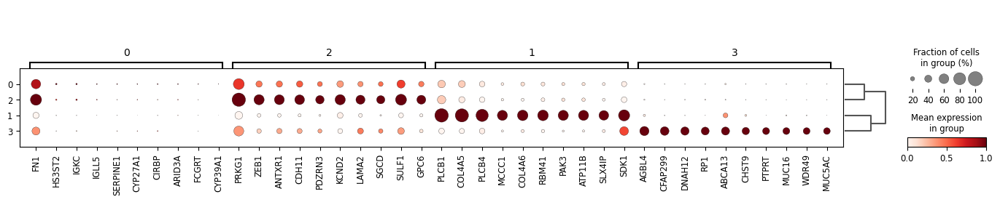

In [47]:
# Dotplot
sc.pl.rank_genes_groups_dotplot(
            adata_bottom_right,
            key='rank_genes_leiden_0.5',  
            groupby='leiden_0.5',
            n_genes=10,
            min_logfoldchange = 1,
            standard_scale='var',
            #save= "_bottom_right.png")

### **Annotations Spatial Scatter**

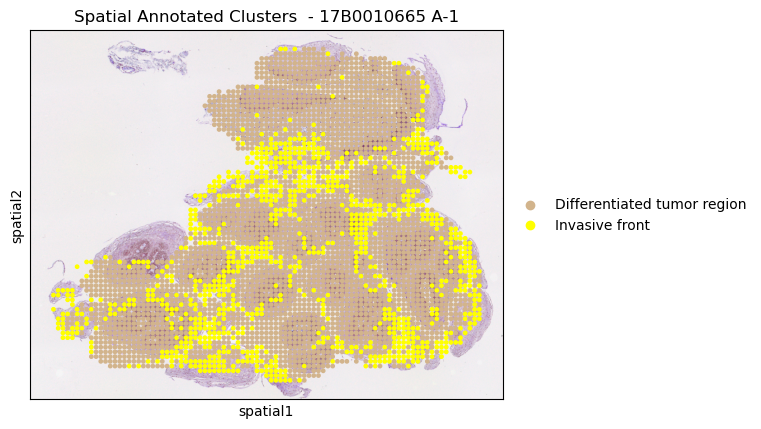

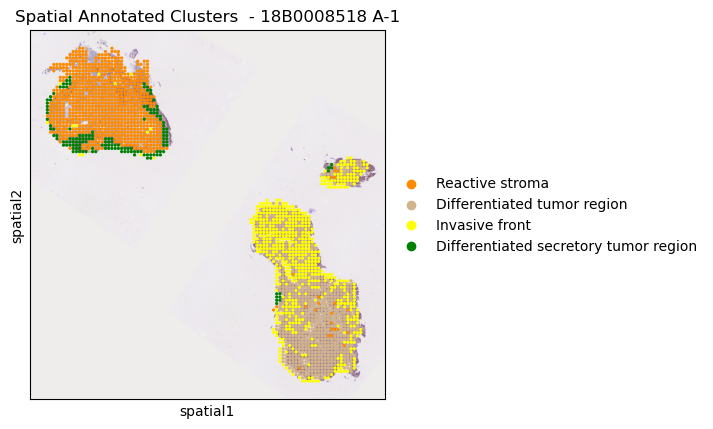

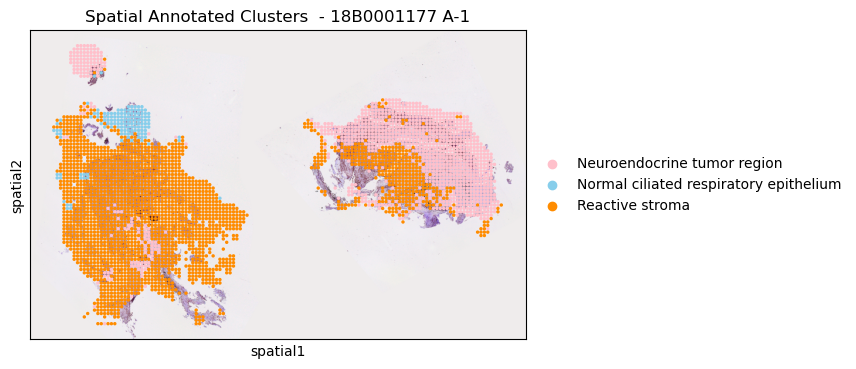

In [51]:
# Annotations per cluster
cluster_annotations_upper_left = {
    '0': 'Differentiated tumor region',
    '1': 'Differentiated tumor region',
    '2': 'Invasive front'}

cluster_annotations_upper_right = {
    '0': 'Reactive stroma',
    '1': 'Differentiated tumor region',
    '2': 'Invasive front',
    '3': 'Differentiated secretory tumor region'}

cluster_annotations_bottom_right = {
    '0': 'Reactive stroma',
    '1': 'Neuroendocrine tumor region',
    '2': 'Reactive stroma',
    '3': 'Normal ciliated respiratory epithelium'}

# Dictionary: object with adata, Leiden column and annotations map
regions = {
    "17B0010665 A-1": {
        "adata": adata_upper_left,
        "cluster_col": "leiden_0.7",   
        "annotations": cluster_annotations_upper_left
    },
    "18B0008518 A-1": {
        "adata": adata_upper_right,
        "cluster_col": "leiden_0.8",   
        "annotations": cluster_annotations_upper_right
    },
    "18B0001177 A-1": {
        "adata": adata_bottom_right,
        "cluster_col": "leiden_0.5",   
        "annotations": cluster_annotations_bottom_right
    }}

# Custom color palette
annotation_palette = {
    'Low quality': 'dimgray',
    'Neuroendocrine tumor region': 'pink',
    'Reactive stroma': 'darkorange',
    'Normal ciliated respiratory epithelium': 'skyblue',
    'Differentiated secretory tumor region': 'green',
    'Differentiated tumor region': 'tan',
    'Invasive front': 'yellow'}

for name, info in regions.items():
    adata = info["adata"]
    cluster_col = info["cluster_col"]
    cluster_annotations = info["annotations"]

    # Assign annotation
    adata.obs['cluster_annot'] = adata.obs[cluster_col].map(cluster_annotations)

    # Plot annotated clustering
    sc.pl.spatial(
        adata,
        color='cluster_annot',
        img_key='HeElowRes',
        alpha=1.0,
        title=f'Spatial Annotated Clusters  - {name}',
        palette=annotation_palette,
        return_fig=True,
        #save= f'_annotated_{name}.png')


In [52]:
adata_upper_left

AnnData object with n_obs × n_vars = 3875 × 13477
    obs: 'orig.ident', 'x', 'y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'underTissue', 'keep', 'n_counts', 'leiden_0.7', 'cluster_annot'
    var: 'mito', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'binSize', 'bin_size', 'bin_type', 'description', 'orig_var_names', 'resolution', 'sn', 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.7_colors', 'rank_genes_leiden_0.7', 'dendrogram_leiden_0.7', 'cluster_annot_colors'
    obsm: 'spatial',

In [53]:
adata_upper_right

AnnData object with n_obs × n_vars = 2205 × 13615
    obs: 'orig.ident', 'x', 'y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'underTissue', 'keep', 'n_counts', 'leiden_0.8', 'cluster_annot'
    var: 'mito', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'binSize', 'bin_size', 'bin_type', 'description', 'orig_var_names', 'resolution', 'sn', 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.8_colors', 'rank_genes_leiden_0.8', 'dendrogram_leiden_0.8', 'cluster_annot_colors'
    obsm: 'spatial',

In [54]:
adata_bottom_left

AnnData object with n_obs × n_vars = 423 × 5827
    obs: 'orig.ident', 'x', 'y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'underTissue', 'keep', 'n_counts', 'leiden_0.6'
    var: 'mito', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'binSize', 'bin_size', 'bin_type', 'description', 'orig_var_names', 'resolution', 'sn', 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.6_colors', 'rank_genes_leiden_0.6', 'dendrogram_leiden_0.6'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp

In [55]:
adata_bottom_right

AnnData object with n_obs × n_vars = 3541 × 14300
    obs: 'orig.ident', 'x', 'y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'underTissue', 'keep', 'n_counts', 'leiden_0.5', 'cluster_annot'
    var: 'mito', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'binSize', 'bin_size', 'bin_type', 'description', 'orig_var_names', 'resolution', 'sn', 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.5_colors', 'rank_genes_leiden_0.5', 'dendrogram_leiden_0.5', 'cluster_annot_colors'
    obsm: 'spatial',

In [ ]:
#adata_upper_left.write("final_upper_left_D03453G3_host.h5ad")
#adata_upper_right.write("final_upper_right_D03453G3_host.h5ad")
#adata_bottom_right.write("final_bottom_right_D03453G3_host.h5ad")